In [1]:
import numpy as np
import matplotlib.pyplot as plt
from numpy import log
import ultranest
from ultranest.plot import cornerplot
from scipy.stats import poisson
import pandas as pd
import healpy as hp
from healpy.newvisufunc import projview, newprojplot
import astropy.units as u
from matplotlib import colors as mcolors
from ultranest.utils import resample_equal
from scipy.interpolate import interp1d
import scipy.stats as stats
import ultranest.stepsampler
import itertools
import gc
import json
import corner
import os
from matplotlib.colors import Normalize
import matplotlib.colors as mcolors


In [2]:
from my_functions import *
def dipole_plotting(m, dipole_theta=None, dipole_phi=None, title=None, unit=None, cmap='plasma', vmin=None, vmax=None):
    projview(m, title=title, unit=unit,
    graticule=True, graticule_labels=True, projection_type="mollweide", cmap=cmap, min=vmin, max=vmax);

    newprojplot(theta=dipole_theta, phi=dipole_phi, marker="*", color="k", markersize=15);
    plt.tight_layout()
    return

# Masking by radius from some direction 

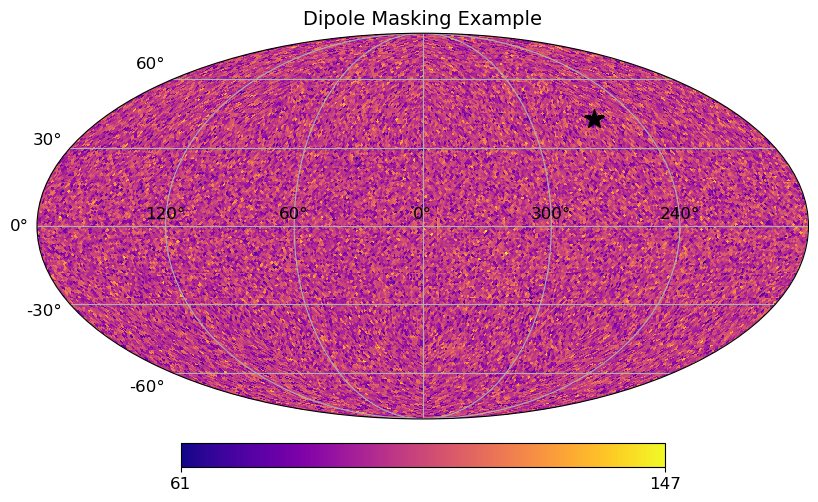

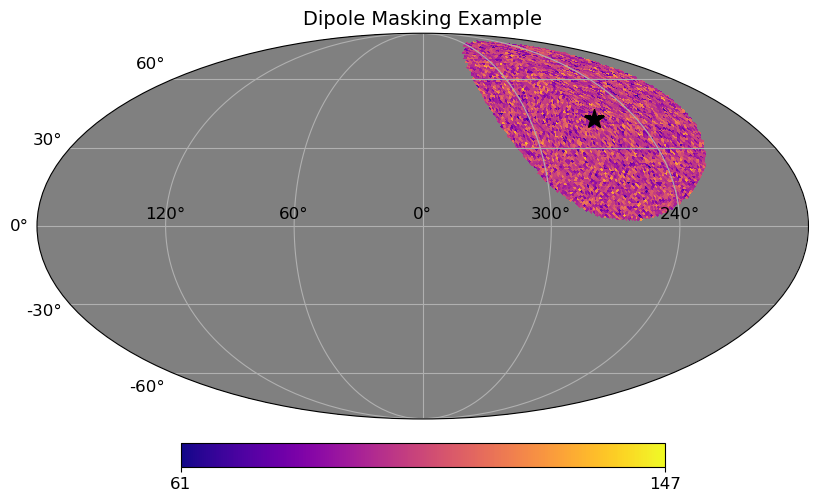

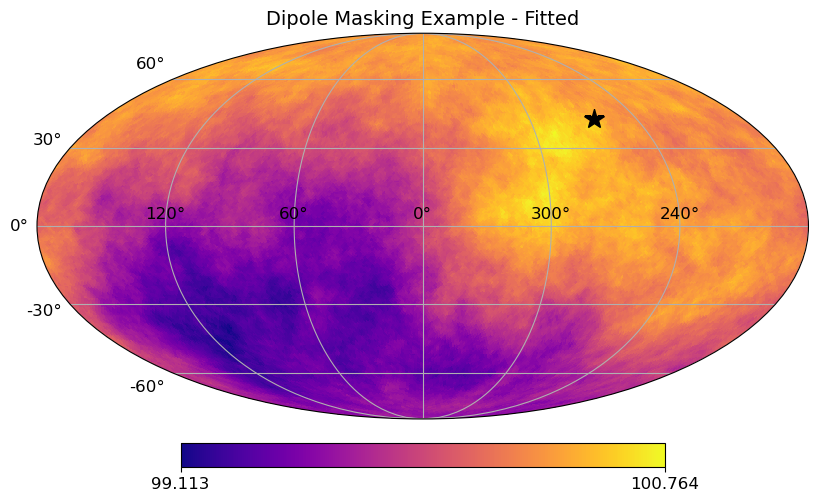

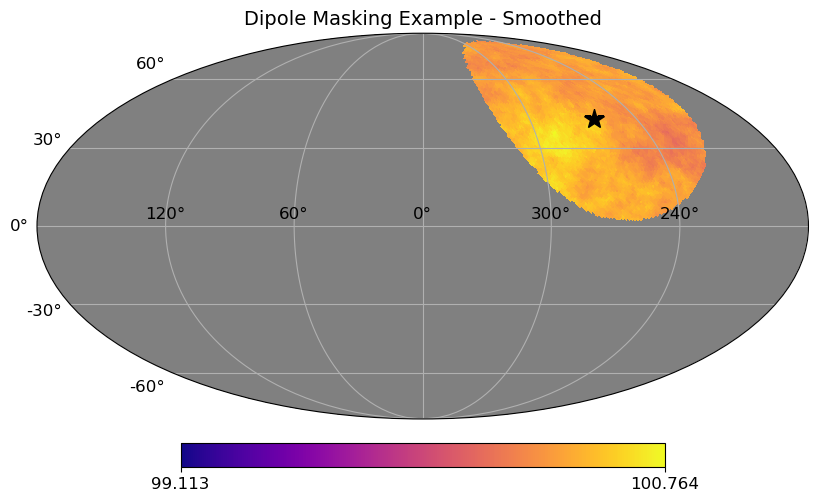

In [6]:
NSIDE=64
NPIX = hp.nside2npix(NSIDE)

dipole_theta = np.deg2rad(48) # CMB Directions
dipole_phi = -np.deg2rad(360-264)
vec = hp.ang2vec(dipole_theta, dipole_phi)

np.random.seed(42)  # For reproducibility
m, lambda_i = dipole_sampling(NSIDE, N_bar=100, D=0.007, dipole_theta=dipole_theta, dipole_phi=dipole_phi)
smooth_map = compute_smooth_map(m,angle_scale=1)
ipix_disc = hp.query_disc(nside=NSIDE, vec=vec, radius=np.radians(40))

mask = np.zeros(NPIX, dtype=bool)
mask[ipix_disc] = True  # Set the disc pixels to True

# For plotting, we need the array to be of length NPIX
m_plot = hp.ma(m.copy().astype(float))
m_plot.mask = ~mask

m_plot_smooth = hp.ma(smooth_map.copy().astype(float))
m_plot_smooth.mask = ~mask

# for fitting, can't use nans need to remove the masked indices. Also need fit_mask to mask in likelihood too
m_fit = m.copy()
fit_mask = mask
m_fit = m[fit_mask]

# Set the masked values to be gray for plotting
cmap = plt.get_cmap('plasma').copy()
cmap.set_bad('gray')

norm = mcolors.Normalize(vmin=np.min(m), vmax=np.max(m))
norm_smooth = mcolors.Normalize(vmin=np.min(smooth_map), vmax=np.max(smooth_map))


dipole_plotting(m, dipole_theta, dipole_phi, cmap=cmap, title='Dipole Masking Example')

dipole_plotting(m_plot, dipole_theta, dipole_phi, cmap=cmap, title='Dipole Masking Example', vmin=norm.vmin, vmax=norm.vmax)

dipole_plotting(smooth_map, dipole_theta, dipole_phi, cmap=cmap, title='Dipole Masking Example - Fitted')

dipole_plotting(m_plot_smooth, dipole_theta, dipole_phi, cmap=cmap, title='Dipole Masking Example - Smoothed', vmin=norm_smooth.vmin, vmax=norm_smooth.vmax)


# Now set the bin centres to be the centre of the NSIDE=3 pixels 

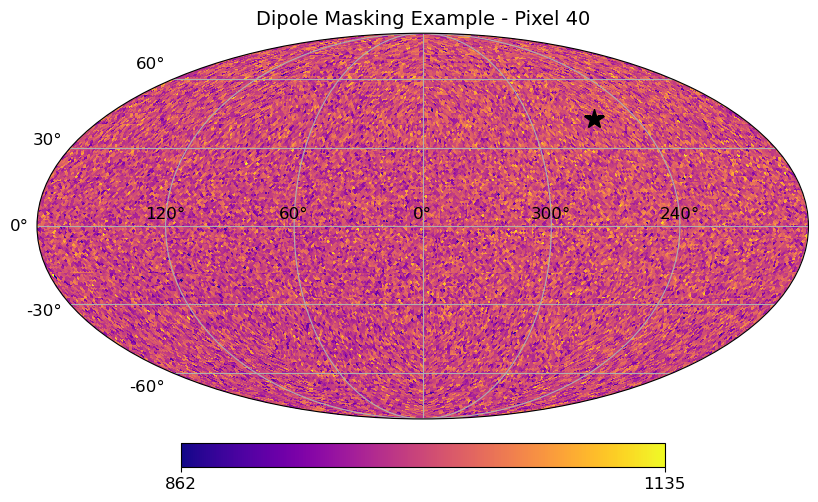

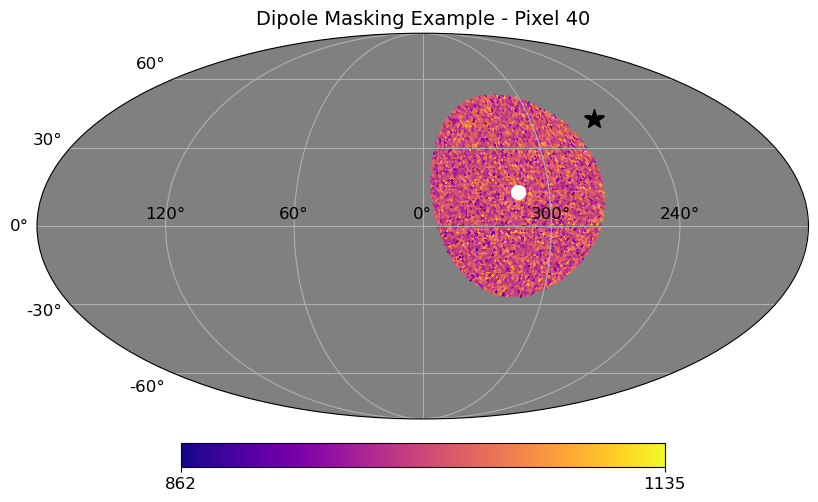

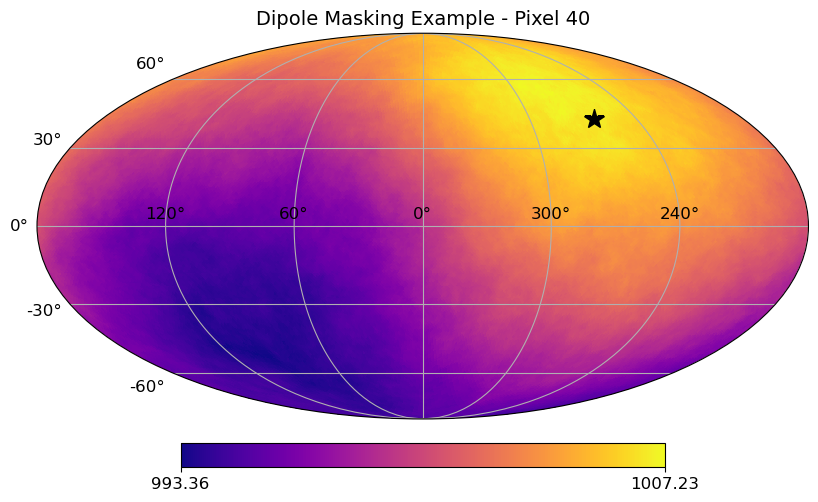

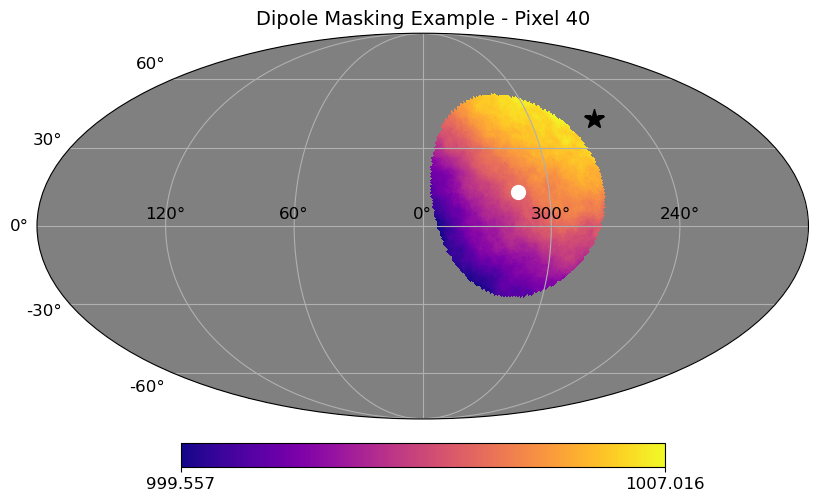

In [7]:
NSIDE_centres = 3
NPIX_centres = hp.nside2npix(NSIDE_centres)

NSIDE = 64
NPIX = hp.nside2npix(NSIDE)
dipole_theta = np.deg2rad(48) # CMB Directions
dipole_phi = -np.deg2rad(360-264)

np.random.seed(15)  # For reproducibility
m, lambda_i = dipole_sampling(NSIDE, N_bar=1000, D=0.007, dipole_theta=dipole_theta, dipole_phi=dipole_phi)
smooth_map = compute_smooth_map(m, angle_scale=1)


pixel = 46
theta, phi = hp.pix2ang(NSIDE_centres, pixel)

# Convert phi to range [-π, π]
phi = (phi + np.pi) % (2 * np.pi) - np.pi

vec = hp.ang2vec(theta, phi)
ipix_disc = hp.query_disc(nside=NSIDE, vec=vec, radius=np.radians(40))

mask = np.zeros(NPIX, dtype=bool)
mask[ipix_disc] = True  # Set the disc pixels to True

# For plotting, we need the array to be of length NPIX
m_plot = hp.ma(m.copy().astype(float))
m_plot.mask = ~mask

m_plot_smooth = hp.ma(smooth_map.copy().astype(float))
m_plot_smooth.mask = ~mask

# for fitting, can't use nans need to remove the masked indices. Also need fit_mask to mask in likelihood too
m_fit = m.copy()
fit_mask = mask
m_fit = m[fit_mask]

cmap = plt.get_cmap('plasma').copy()
cmap.set_bad('gray')

norm = mcolors.Normalize(vmin=np.min(m), vmax=np.max(m))
norm_smooth = mcolors.Normalize(vmin=np.min(smooth_map), vmax=np.max(smooth_map))


dipole_plotting(m, dipole_theta, dipole_phi, cmap=cmap, title='Dipole Masking Example - Pixel 40')

dipole_plotting(m_plot, dipole_theta, dipole_phi, vmin=norm.vmin, vmax=norm.vmax, cmap=cmap, title='Dipole Masking Example - Pixel 40')
newprojplot(theta=theta, phi=phi, marker="o", color="white", markersize=10);

dipole_plotting(smooth_map, dipole_theta, dipole_phi, cmap=cmap, title='Dipole Masking Example - Pixel 40')

dipole_plotting(m_plot_smooth, dipole_theta, dipole_phi, vmin=None, vmax=None, cmap=cmap, title='Dipole Masking Example - Pixel 40')
newprojplot(theta=theta, phi=phi, marker="o", color="white", markersize=10);

In [57]:
plt.close()

# Now Dipole and Quadrpole Data 

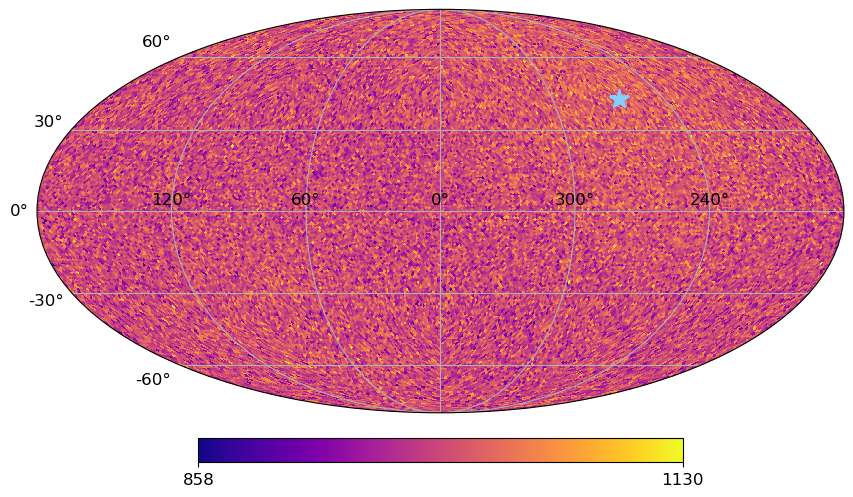

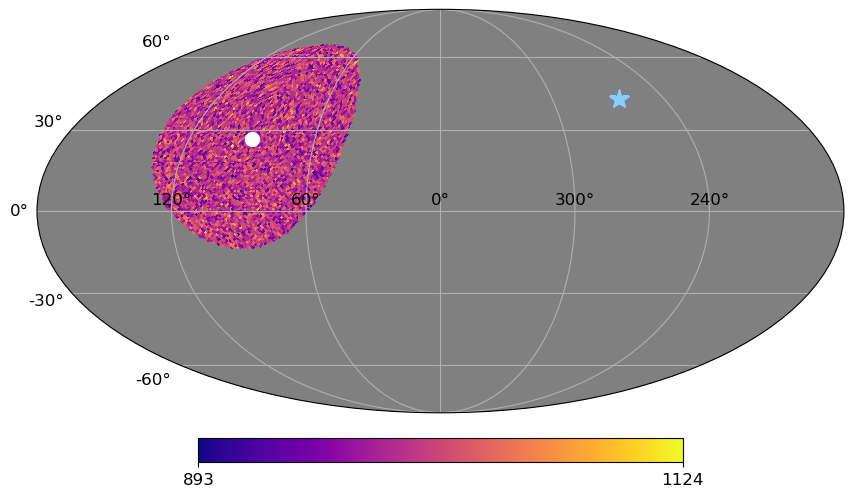

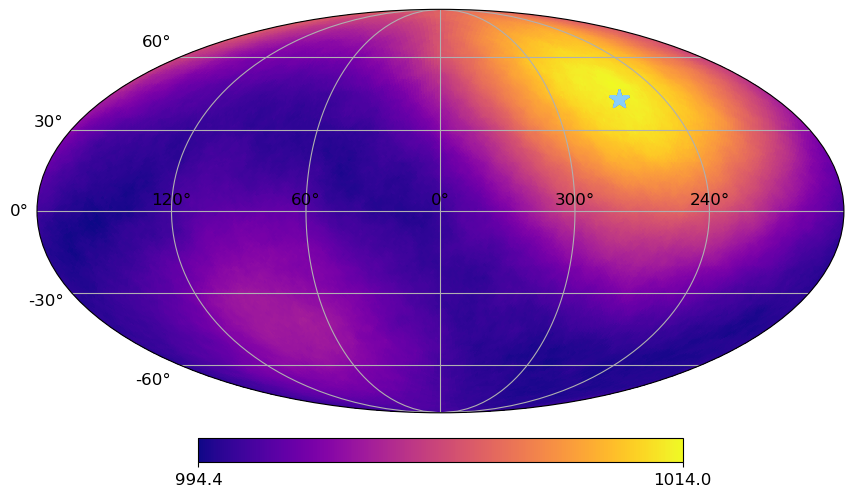

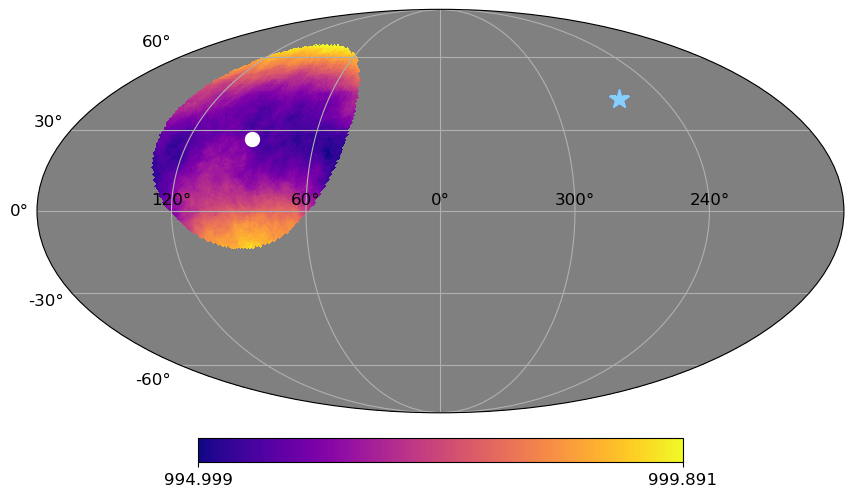

In [8]:
NSIDE_centres = 3
NPIX_centres = hp.nside2npix(NSIDE_centres)

NSIDE = 64
NPIX = hp.nside2npix(NSIDE)
dipole_theta = np.deg2rad(48) # CMB Directions
dipole_phi = -np.deg2rad(360-264)
q_vector_1 = [dipole_theta, dipole_phi]  # l1, b1
q_vector_2 = [dipole_theta, dipole_phi] 


np.random.seed(15)  # For reproducibility
m, lambda_i = dipole_quad_sampling(NSIDE, N_bar=1000, D=0.007, Q=0.014, d_vector=[dipole_theta,dipole_phi], q_vector_1=q_vector_1, q_vector_2=q_vector_2)
smooth_map = compute_smooth_map(m, angle_scale=1)


pixel = 27
theta, phi = hp.pix2ang(NSIDE_centres, pixel)

# Convert phi to range [-π, π]
phi = (phi + np.pi) % (2 * np.pi) - np.pi

vec = hp.ang2vec(theta, phi)
ipix_disc = hp.query_disc(nside=NSIDE, vec=vec, radius=np.radians(40))

mask = np.zeros(NPIX, dtype=bool)
mask[ipix_disc] = True  # Set the disc pixels to True

# For plotting, we need the array to be of length NPIX
m_plot = hp.ma(m.copy().astype(float))
m_plot.mask = ~mask

m_plot_smooth = hp.ma(smooth_map.copy().astype(float))
m_plot_smooth.mask = ~mask

# for fitting, can't use nans need to remove the masked indices. Also need fit_mask to mask in likelihood too
m_fit = m.copy()
fit_mask = mask
m_fit = m[fit_mask]

cmap = plt.get_cmap('plasma').copy()
cmap.set_bad('gray')

norm = mcolors.Normalize(vmin=np.min(m), vmax=np.max(m))
norm_smooth = mcolors.Normalize(vmin=np.min(smooth_map), vmax=np.max(smooth_map))


dipole_quad_plotting(m, d_vector=[dipole_theta, dipole_phi], q_vector_1=q_vector_1, q_vector_2=q_vector_2, cmap=cmap)

dipole_quad_plotting(m_plot, d_vector=[dipole_theta, dipole_phi], q_vector_1=q_vector_1, q_vector_2=q_vector_2, cmap=cmap)
newprojplot(theta=theta, phi=phi, marker="o", color="white", markersize=10);

dipole_quad_plotting(smooth_map, d_vector=[dipole_theta, dipole_phi], q_vector_1=q_vector_1, q_vector_2=q_vector_2, cmap=cmap)

dipole_quad_plotting(m_plot_smooth, d_vector=[dipole_theta, dipole_phi], q_vector_1=q_vector_1, q_vector_2=q_vector_2, cmap=cmap)
newprojplot(theta=theta, phi=phi, marker="o", color="white", markersize=10);

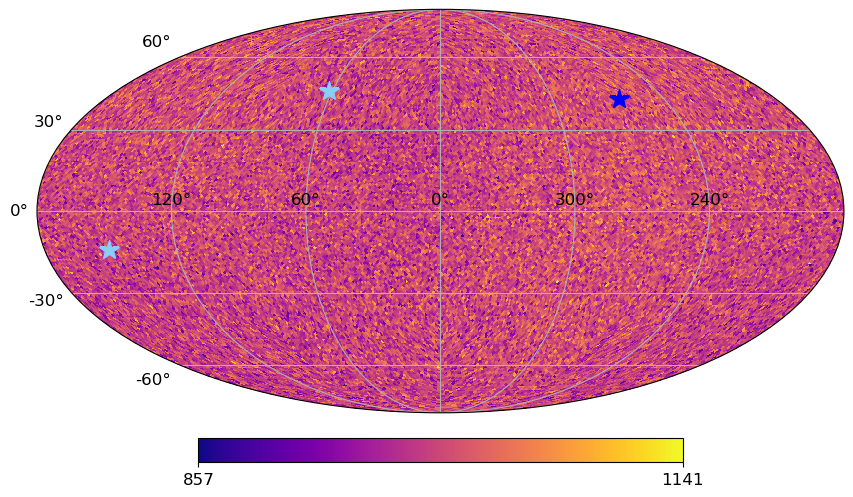

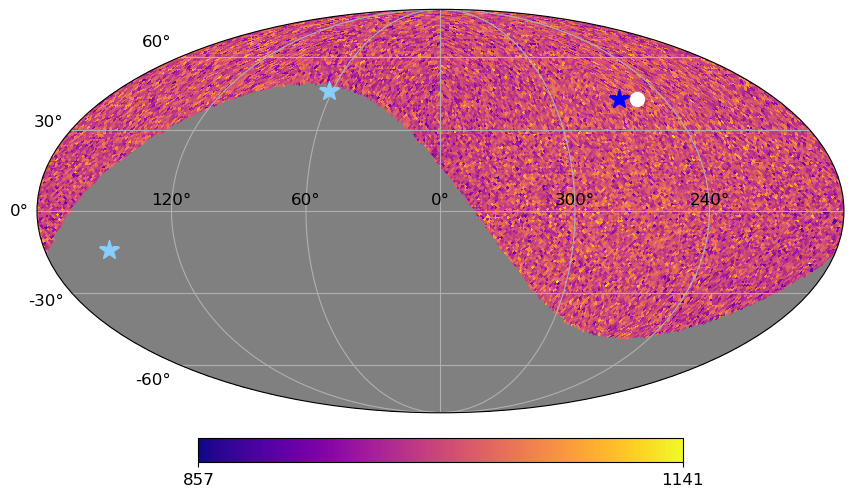

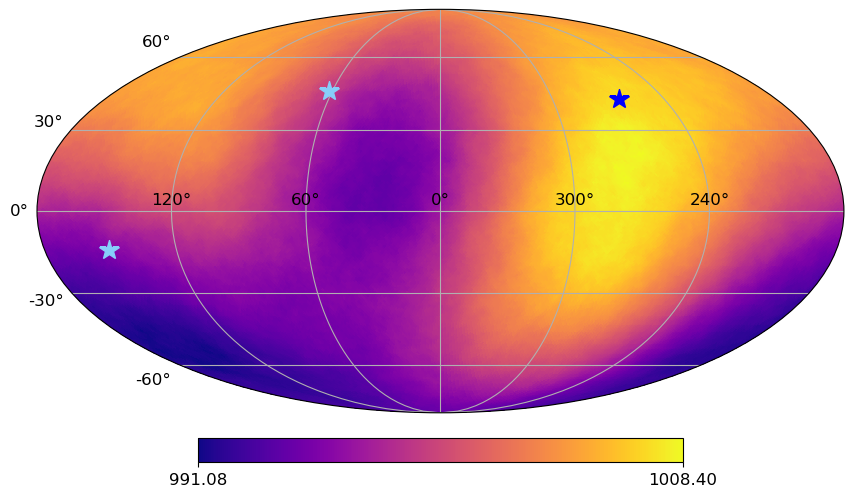

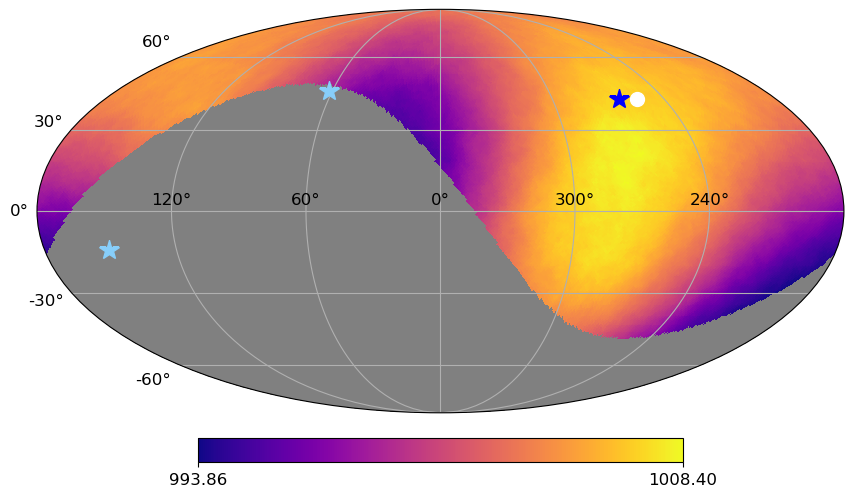

In [12]:
def draw_vectors(n):
    """Draw n random vectors on the sphere."""
    c = np.random.uniform(0,1,n)
    theta = np.arccos(1 - 2 * c)
    phi = np.random.uniform(0, 2 * np.pi, n)

    vectors = np.array([theta, phi]).T
    return vectors

NSIDE_centres = 3
NPIX_centres = hp.nside2npix(NSIDE_centres)

NSIDE = 64
NPIX = hp.nside2npix(NSIDE)
dipole_theta = np.deg2rad(48) # CMB Directions
dipole_phi = -np.deg2rad(360-264)
vectors = draw_vectors(2)
q_vector_1 = vectors[0]
q_vector_2 = vectors[1]


np.random.seed(15)  # For reproducibility
m, lambda_i = dipole_quad_sampling(NSIDE, N_bar=1000, D=0.007, Q=0.014, d_vector=[dipole_theta,dipole_phi], q_vector_1=q_vector_1, q_vector_2=q_vector_2)
smooth_map = compute_smooth_map(m, angle_scale=1)


pixel = 20
theta, phi = hp.pix2ang(NSIDE_centres, pixel)

# Convert phi to range [-π, π]
phi = (phi + np.pi) % (2 * np.pi) - np.pi

vec = hp.ang2vec(theta, phi)
ipix_disc = hp.query_disc(nside=NSIDE, vec=vec, radius=np.radians(90))

mask = np.zeros(NPIX, dtype=bool)
mask[ipix_disc] = True  # Set the disc pixels to True

# For plotting, we need the array to be of length NPIX
m_plot = hp.ma(m.copy().astype(float))
m_plot.mask = ~mask

m_plot_smooth = hp.ma(smooth_map.copy().astype(float))
m_plot_smooth.mask = ~mask

# for fitting, can't use nans need to remove the masked indices. Also need fit_mask to mask in likelihood too
m_fit = m.copy()
fit_mask = mask
m_fit = m[fit_mask]

cmap = plt.get_cmap('plasma').copy()
cmap.set_bad('gray')

norm = mcolors.Normalize(vmin=np.min(m), vmax=np.max(m))
norm_smooth = mcolors.Normalize(vmin=np.min(smooth_map), vmax=np.max(smooth_map))


dipole_quad_plotting(m, d_vector=[dipole_theta, dipole_phi], q_vector_1=q_vector_1, q_vector_2=q_vector_2, cmap=cmap)

dipole_quad_plotting(m_plot, d_vector=[dipole_theta, dipole_phi], q_vector_1=q_vector_1, q_vector_2=q_vector_2, cmap=cmap)
newprojplot(theta=theta, phi=phi, marker="o", color="white", markersize=10);

dipole_quad_plotting(smooth_map, d_vector=[dipole_theta, dipole_phi], q_vector_1=q_vector_1, q_vector_2=q_vector_2, cmap=cmap)

dipole_quad_plotting(m_plot_smooth, d_vector=[dipole_theta, dipole_phi], q_vector_1=q_vector_1, q_vector_2=q_vector_2, cmap=cmap)
newprojplot(theta=theta, phi=phi, marker="o", color="white", markersize=10);

# Great! Now define a general function and loop 

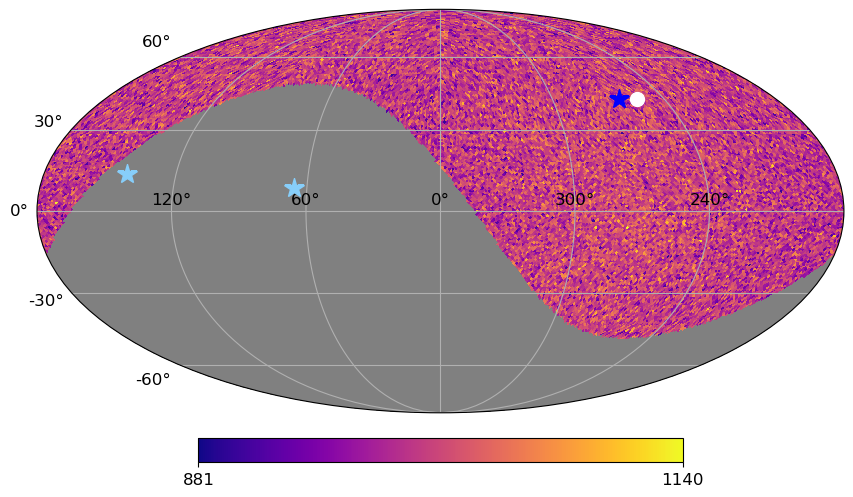

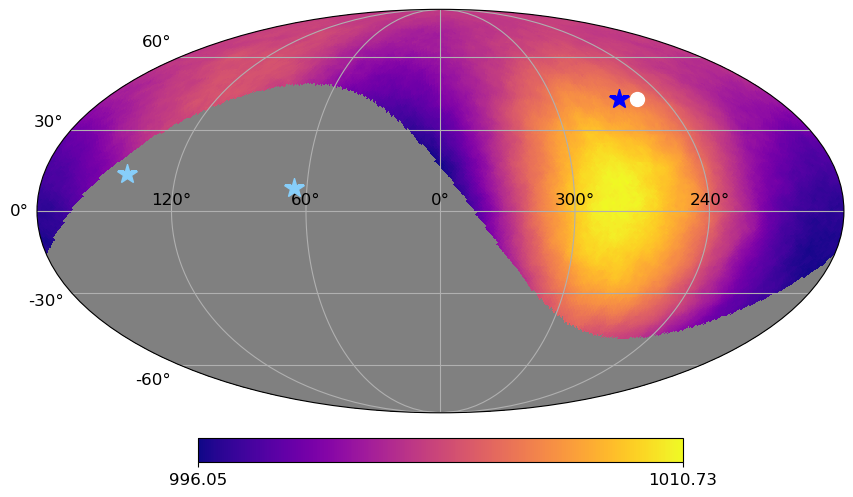

In [24]:
def partial_sky_masking(m, theta, phi, r=40): 
    smooth_map = compute_smooth_map(m, angle_scale=1)
    vec = hp.ang2vec(theta, phi)
    ipix_disc = hp.query_disc(nside=NSIDE, vec=vec, radius=np.radians(r))

    mask = np.zeros(NPIX, dtype=bool)
    mask[ipix_disc] = True  # Set the disc pixels to True

    # For plotting, we need the array to be of length NPIX
    m_plot = hp.ma(m.copy().astype(float))
    m_plot.mask = ~mask

    m_plot_smooth = hp.ma(smooth_map.copy().astype(float))
    m_plot_smooth.mask = ~mask

    # for fitting, can't use nans need to remove the masked indices. Also need fit_mask to mask in likelihood too
    m_fit = m.copy()
    fit_mask = mask
    m_fit = m[fit_mask]

    return m_plot, m_plot_smooth, m_fit, fit_mask

NSIDE_centres = 3
NPIX_centres = hp.nside2npix(NSIDE_centres)

NSIDE = 64
NPIX = hp.nside2npix(NSIDE)
dipole_theta = np.deg2rad(48) # CMB Directions
dipole_phi = -np.deg2rad(360-264)

pixel = 20
theta, phi = hp.pix2ang(NSIDE_centres, pixel)

# Convert phi to range [-π, π]
phi = (phi + np.pi) % (2 * np.pi) - np.pi

for i in range(1): #increase size to do more
    vectors = draw_vectors(2)
    q_vector_1 = vectors[0]
    q_vector_2 = vectors[1]
    m, lambda_i = dipole_quad_sampling(NSIDE, N_bar=1000, D=0.007, Q=0.014, d_vector=[dipole_theta,dipole_phi], q_vector_1=q_vector_1, q_vector_2=q_vector_2)
    
    m_plot, m_plot_smooth, m_fit, fit_mask = partial_sky_masking(m, theta, phi, r=90)

    dipole_quad_plotting(m_plot, d_vector=[dipole_theta, dipole_phi], q_vector_1=q_vector_1, q_vector_2=q_vector_2, cmap=cmap)
    newprojplot(theta=theta, phi=phi, marker="o", color="white", markersize=10);

    dipole_quad_plotting(m_plot_smooth, d_vector=[dipole_theta, dipole_phi], q_vector_1=q_vector_1, q_vector_2=q_vector_2, cmap=cmap)
    newprojplot(theta=theta, phi=phi, marker="o", color="white", markersize=10);
    
    # plt.close()

# Great. Now lets look at the cluster data. I fit models to the data for each of the 108 pixels. Lets look at the Bayes factors and posteriors. 

In [11]:
# read in the bayes factors from cluster runs

pathname = '../log_dir/Dipole_and_Quadrupole_Data/Partial_Skies/'


models = ['Monopole_model', 'Dipole_model', 'Quadrupole_model', 'Dipole_Quadrupole_model']

N_bar = 1000 # try 1000 or 2000, these are the runs I have done so far
pixels = range(0,108)

df = pd.DataFrame(columns=['model', 'pixel', 'evidence'])


for model in models:
    for pix in pixels:
        filepath = pathname + f'{model}/Nbar_{N_bar}_pixel_{pix}/info/results.json'
        if os.path.exists(filepath):
            with open(filepath, 'r') as f:
                data = json.load(f)
            evidence = data['logz']
            # append to a dataframe, need columns for model, N_bar, mask_angle, evidence
            new_row = pd.DataFrame([{'model': model, 'pixel': pix, 'evidence': evidence}])
            df = pd.concat([df, new_row], ignore_index=True)
        else:
            print(f'File not found: {filepath}')



KeyboardInterrupt: 

In [240]:
# Pivot the dataframe so each row is a pixel and each model is a column
df['pixel'] = df['pixel'].astype(int)  # Ensure pixel is numeric
pivot_df = df.pivot(index='pixel', columns='model', values='evidence')

# Compute Bayes factors
pivot_df['B_30'] = pivot_df['Dipole_Quadrupole_model'] - pivot_df['Monopole_model']
pivot_df['B_31'] = pivot_df['Dipole_Quadrupole_model'] - pivot_df['Dipole_model']
pivot_df['B_32'] = pivot_df['Dipole_Quadrupole_model'] - pivot_df['Quadrupole_model']

# If desired, extract just the Bayes factors
bayes_factors = pivot_df[['B_30', 'B_31', 'B_32']].reset_index()
bayes_factors

model,pixel,B_30,B_31,B_32
0,0,69.355663,-1.439116,-0.285108
1,1,67.704987,0.775933,-0.977544
2,2,85.740395,-0.174461,-0.888124
3,3,80.156789,-0.526185,-0.950376
4,4,71.031574,-0.596334,-0.497881
...,...,...,...,...
103,103,-2.618763,-2.534643,-2.797555
104,104,12.942475,-2.052179,-1.682973
105,105,12.840933,0.346411,-1.106667
106,106,1.556060,-1.404183,-1.689606


# okay, so now each column is an array of length NPIX_centre, the number of pixels for NSIDE=3. So we can plot these on a hp projection

In [199]:
pathname = '../log_dir/Dipole_and_Quadrupole_Data/Partial_Skies/'
# data = np.load(pathname+f'Datasets/skymap_data_Nbar_{N_bar}.npy',
#                     allow_pickle=True).item()
# m = data['m']
np.random.seed(42)  # For reproducibility
dipole_theta = np.deg2rad(48) # CMB Directions
dipole_phi = -np.deg2rad(360-264)
q_vector_1 = [dipole_theta, dipole_phi]  # l1, b1
q_vector_2 = [dipole_theta, dipole_phi]  # l2, b2
m, lambda_i = dipole_quad_sampling(NSIDE, N_bar=2000, D=0.007, Q=0.014, d_vector=[dipole_theta,dipole_phi], q_vector_1=q_vector_1, q_vector_2=q_vector_2)
smooth_map = compute_smooth_map(m, angle_scale=1)

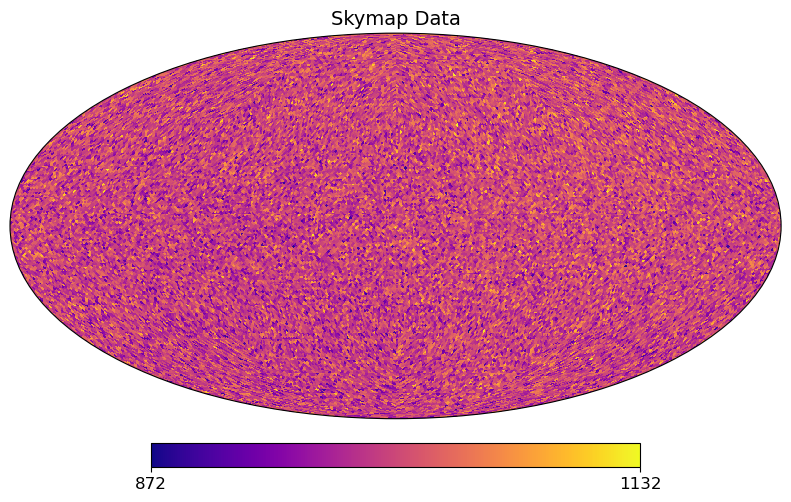

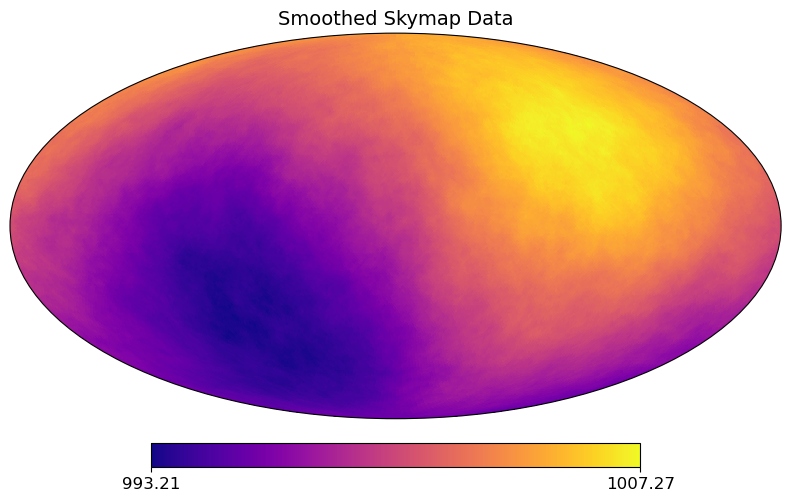

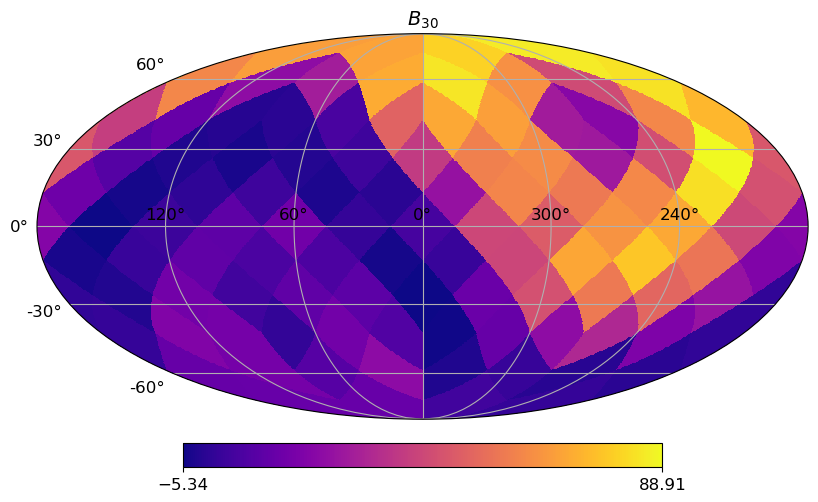

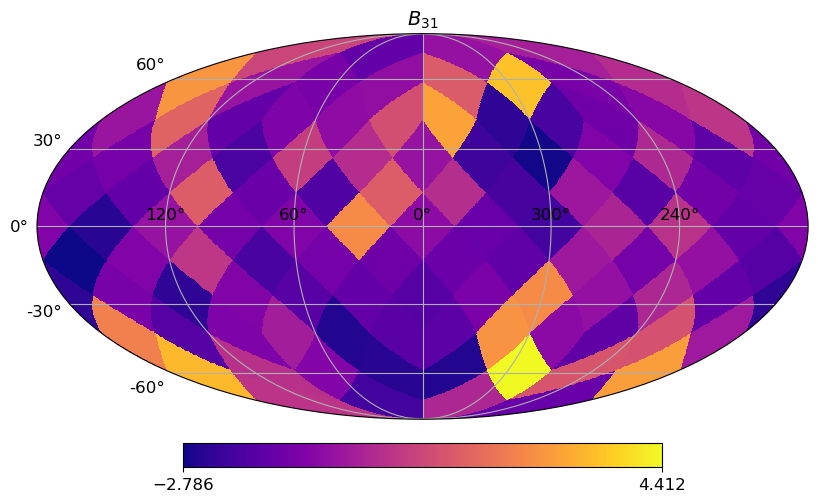

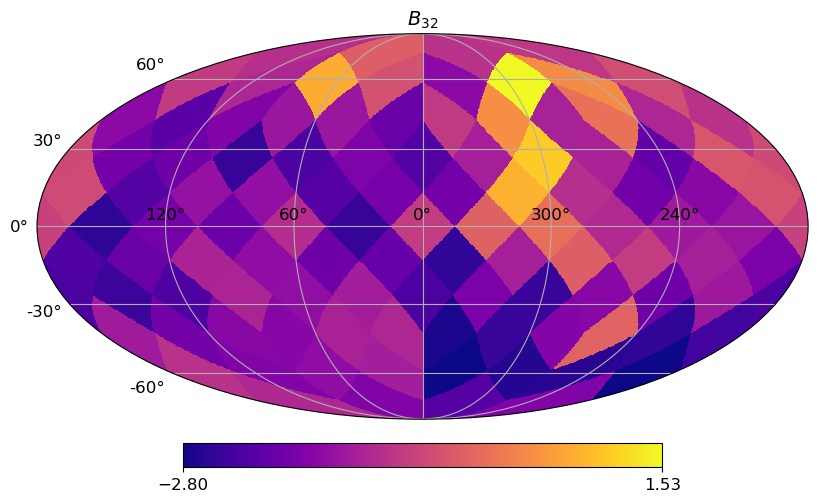

In [241]:
B_30 = bayes_factors['B_30'].values
B_31 = bayes_factors['B_31'].values
B_32 = bayes_factors['B_32'].values

from matplotlib.colors import TwoSlopeNorm

# Raw map
hp.projview(m, title='Skymap Data', cmap='plasma')

# Smooth map
hp.projview(smooth_map, title='Smoothed Skymap Data', cmap='plasma')

#B_30
min = -3
max = 5
hp.projview(B_30, title=r'$B_{30}$', unit=None,
    graticule=True, graticule_labels=True, projection_type="mollweide", cmap='plasma')#, min=min, max=max)
# cbar_ax = plt.gcf().axes[-1]
# ticks = [min, 0, max]
# cbar_ax.set_xticks(ticks)
# cbar_ax.set_xticklabels([f"{tick:.1f}" for tick in ticks])
plt.show()

# B_31
min = -3
max = 5
hp.projview(B_31, title=r'$B_{31}$', unit=None,
    graticule=True, graticule_labels=True, projection_type="mollweide", cmap='plasma')#, min=min, max=max)
# cbar_ax = plt.gcf().axes[-1]
# ticks = [min, 0, max]
# cbar_ax.set_xticks(ticks)
# cbar_ax.set_xticklabels([f"{tick:.1f}" for tick in ticks])
plt.show()

# B_32
min = -3
max = 5
hp.projview(B_32, title=r'$B_{32}$', unit=None,
    graticule=True, graticule_labels=True, projection_type="mollweide", cmap='plasma')#, min=min, max=max)
cbar_ax = plt.gcf().axes[-1]
# ticks = [min, 0, max]
# cbar_ax.set_xticks(ticks)
# cbar_ax.set_xticklabels([f"{tick:.1f}" for tick in ticks])

plt.show()


# Okay interesting. So the B31 comparison is showing us that there is not sufficient evidence for the dipole+quadrupole model over the dipole model alone, no matter where we look. Is this because the count is too low? I'm using 5.75 million, but will double it and run again. It will be interesting to see whether the orientation of the quadrupole has an effect on the Bayes factor. I will try a few different orientations and see if it makes a difference. 

# Here is the results for dipole data, it should match Oliver's results from his paper, showing substantial evidence for the dipole when the gradient is large.

In [69]:
# read in the bayes factors from cluster runs

# Damn, I didnt update the seed so the 20 iterations are all the same. Reruning now, and will look tomorrow. 

pathname = '../log_dir/Dipole_Data/Partial_Skies/'

models = ['Monopole_model', 'Dipole_model']

N_bar = 1000
pixels = range(0,108)
iterations = range(0,20)

df = pd.DataFrame(columns=['model', 'pixel', 'evidence'])


for model in models:
    for pix in pixels:
        for it in iterations:
            filepath = pathname + f'{model}/Nbar_{N_bar}_pixel_{pix}_iteration_{it}/info/results.json'
            if os.path.exists(filepath):
                with open(filepath, 'r') as f:
                    data = json.load(f)
                    evidence = data['logz']
                # append to a dataframe, need columns for model, N_bar, mask_angle, evidence
                new_row = pd.DataFrame([{'model': model, 'pixel': pix, 'iteration': it, 'evidence': evidence}])
                df = pd.concat([df, new_row], ignore_index=True)
            else:
                print(f'File not found: {filepath}')

df_mean = df.groupby(['model', 'pixel'])['evidence'].mean().reset_index()
df_mean.rename(columns={'evidence': 'mean_evidence'}, inplace=True)
df_pivot = df_mean.pivot(index='pixel', columns='model', values='mean_evidence')

# Calculate log Bayes factor: Dipole - Monopole
df_pivot['B_10'] = df_pivot['Dipole_model'] - df_pivot['Monopole_model']
bayes_factors = df_pivot
bayes_factors

OSError: [Errno 89] Operation canceled

In [ ]:
#save bayes_factors
bayes_factors.to_csv('../log_dir/Dipole_Data/Partial_Skies/dipole_monopole_bayes_factors.csv')

In [248]:
np.random.seed(42)  # For reproducibility
dipole_theta = np.deg2rad(48) # CMB Directions
dipole_phi = -np.deg2rad(360-264)
# Was just looking at what the signal looks like as the derivative not the dipole itself
def dipole_sampling_sin(NSIDE, N_bar, D, dipole_theta, dipole_phi):
    NPIX = hp.nside2npix(NSIDE)
    dipole_vec = hp.ang2vec(dipole_theta, dipole_phi) # (x, y, z) from (b, l)    
    pixels = np.vstack(hp.pix2vec(NSIDE, np.arange(NPIX)))
    
    dot_product = np.dot(dipole_vec, pixels)  
    angles = np.arccos(dot_product)
    dipole_signal = D*np.sin(angles)

    lambda_ = N_bar * (1 + dipole_signal)
    sample = np.random.poisson(lambda_)

    return sample, lambda_
m, lambda_i = dipole_sampling_sin(64, N_bar=1000, D=0.007, dipole_theta=dipole_theta, dipole_phi=dipole_phi)

m, lambda_i = dipole_sampling(64, N_bar=1000, D=0.007, dipole_theta=dipole_theta, dipole_phi=dipole_phi)

smooth_map = compute_smooth_map(m, angle_scale=1)

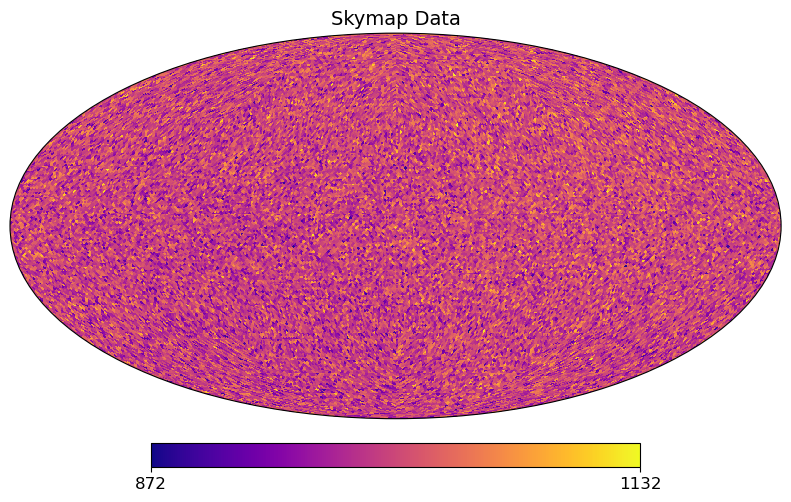

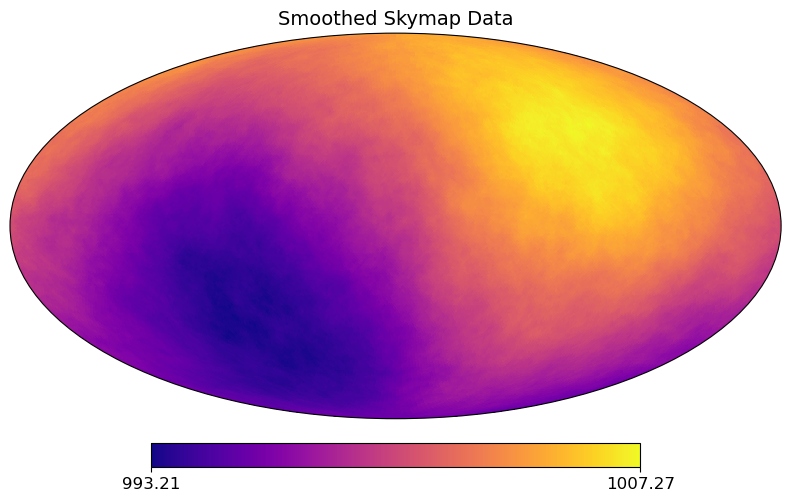

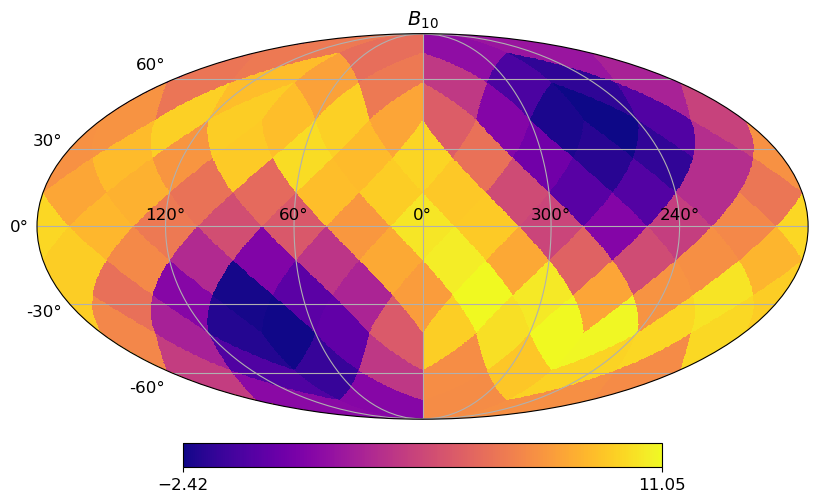

In [255]:
B_10 = bayes_factors['B_10'].values

# Raw map
hp.projview(m, title='Skymap Data', cmap='plasma')

# Smooth map
hp.projview(smooth_map, title='Smoothed Skymap Data', cmap='plasma')

#B_10
hp.projview(B_10, title=r'$B_{10}$', unit=None,
    graticule=True, graticule_labels=True, projection_type="mollweide", cmap='plasma')
# cbar_ax = plt.gcf().axes[-1]
# ticks = [min, 0, max]

# cbar_ax.set_xticks(ticks)
# cbar_ax.set_xticklabels([f"{tick:.1f}" for tick in ticks])
plt.show()


# Now lets average the dipole + quadrupole data 

In [ ]:
import os
import json
import pandas as pd

pathname = '../log_dir/Dipole_and_Quadrupole_Data/Partial_Skies/'

models = ['Monopole_model', 'Dipole_model', 'Quadrupole_model', 'Dipole_Quadrupole_model']

N_bar = 2000
pixels = range(0, 108)
iterations =  range(0, 20)

rows = []  
for model in models:
    for pix in pixels:
        for it in iterations:
            filepath = (
                f"{pathname}{model}/Nbar_{N_bar}/Nbar_{N_bar}_pixel_{pix}_iteration_{it}/info/results.json"
            )
            if os.path.exists(filepath):
                with open(filepath, "r") as f:
                    data = json.load(f)
                    evidence = data["logz"]
                rows.append(
                    {
                        "model": model,
                        "pixel": pix,
                        "iteration": it,
                        "evidence": evidence,
                    }
                )
            else:
                print(f"File not found: {filepath}")

# Build dataframe once
df = pd.DataFrame(rows)

# Compute mean evidence per pixel/model (only over existing files)
df_mean = df.groupby(["model", "pixel"])["evidence"].mean().reset_index()
df_mean.rename(columns={"evidence": "mean_evidence"}, inplace=True)

# Pivot to compare models
df_pivot = df_mean.pivot(index="pixel", columns="model", values="mean_evidence")

# Calculate Bayes factor: Dipole+Quad - monopole
df_pivot["B_30"] = (df_pivot["Dipole_Quadrupole_model"] - df_pivot["Monopole_model"])

# Calculate Bayes factor: Dipole+Quad - Dipole
df_pivot["B_31"] = (df_pivot["Dipole_Quadrupole_model"] - df_pivot["Dipole_model"])

# Calculate Bayes factor: Dipole+Quad - Quadrupole
df_pivot["B_32"] = (df_pivot["Dipole_Quadrupole_model"] - df_pivot["Quadrupole_model"])

bayes_factors = df_pivot
bayes_factors

KeyboardInterrupt: 

In [3]:
# save the bayes_factors df
# bayes_factors.to_csv('../log_dir/Dipole_and_Quadrupole_Data/Partial_Skies/Large_Slice/bayes_factors.csv')
# read in bayes_factors
bayes_factors = pd.read_csv('../log_dir/Dipole_and_Quadrupole_Data/Partial_Skies/Large_Slice/bayes_factors.csv', index_col=0)
bayes_factors

,Dipole_Quadrupole_model,Dipole_model,Monopole_model,Quadrupole_model,B_30,B_31,B_32
pixel,,,,,,,
0,-110452.418375,-110490.691571,-110718.079061,-110506.174917,265.660686,38.273196,53.756542
1,-110436.928161,-110473.984570,-110702.399282,-110495.955566,265.471121,37.056409,59.027405
2,-110458.243461,-110515.781154,-110664.806086,-110498.734861,206.562625,57.537693,40.491401
3,-110455.180489,-110515.227986,-110664.563118,-110499.284122,209.382629,60.047497,44.103633
4,-110457.098938,-110498.570784,-110709.363675,-110520.600380,252.264736,41.471846,63.501441
...,...,...,...,...,...,...,...
103,-110422.710658,-110463.649263,-110488.671276,-110451.389011,65.960618,40.938604,28.678353
104,-110401.673463,-110455.561463,-110454.236233,-110418.072261,52.562770,53.888001,16.398798
105,-110403.677944,-110458.144397,-110460.152480,-110422.124982,56.474537,54.466453,18.447038


In [4]:
# df = pd.read_csv('../Data/results_Nbar_2000.csv')
# df = df[~df["iteration"].isin([4, 6, 7])]
# df_mean = df.groupby(["model", "pixel"])["evidence"].mean().reset_index()
# df_mean.rename(columns={"evidence": "mean_evidence"}, inplace=True)

# # Pivot to compare models
# df_pivot = df_mean.pivot(index="pixel", columns="model", values="mean_evidence")

# # Calculate Bayes factor: Dipole+Quad - monopole
# df_pivot["B_30"] = (df_pivot["Dipole_Quadrupole_model"] - df_pivot["Monopole_model"])

# # Calculate Bayes factor: Dipole+Quad - Dipole
# df_pivot["B_31"] = (df_pivot["Dipole_Quadrupole_model"] - df_pivot["Dipole_model"])

# #Calculate Bayes factor: Dipole+Quad - Quadrupole
# # df_pivot["B_32"] = (df_pivot["Dipole_Quadrupole_model"] - df_pivot["Quadrupole_model"])

# bayes_factors = df_pivot

0.0 180.0 -180.0 180.0
/var/folders/7h/m7_4sh855rz0q0xk3d4dvg_00000gn/T/ipykernel_15280/4143464168.py:149: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


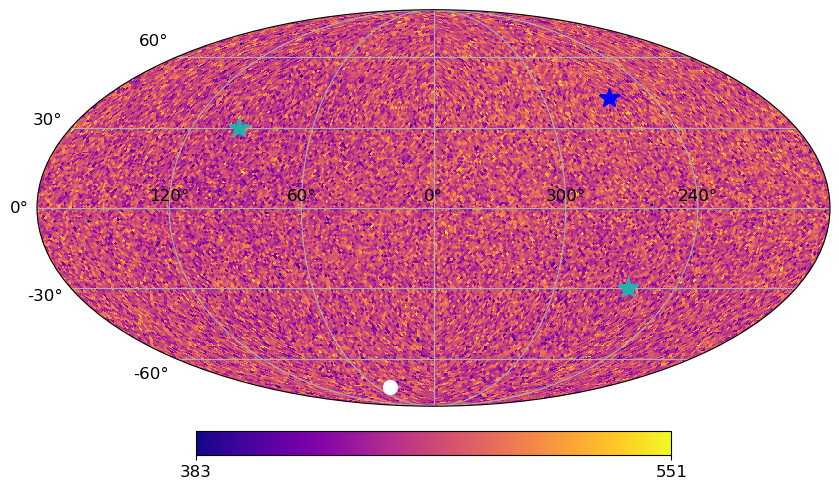

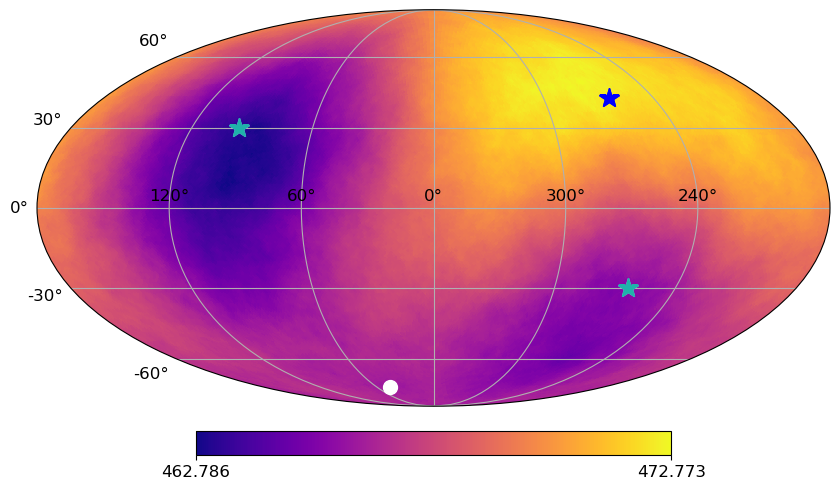

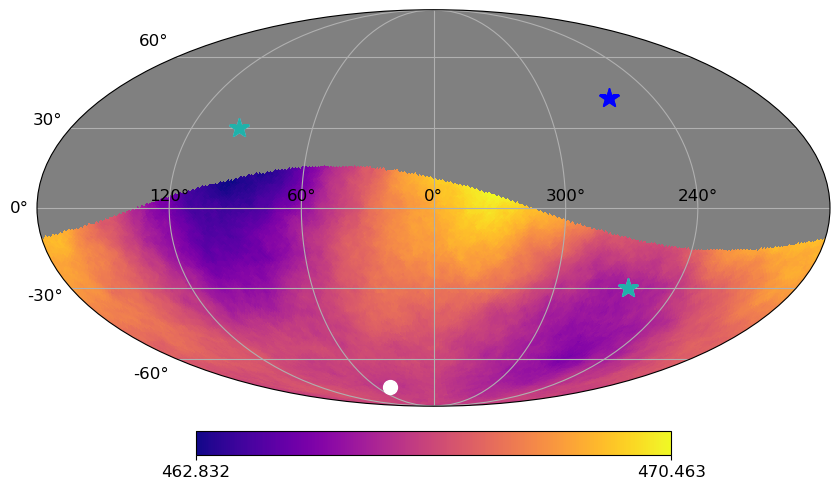

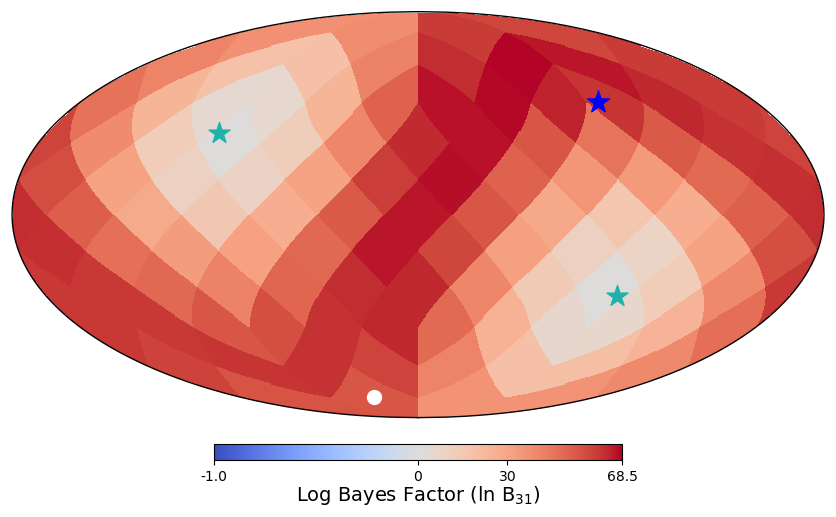

In [7]:
def dipole_quad_sampling(NSIDE, N_bar, D, Q, d_vector, q_vector_1, q_vector_2):
    NPIX = hp.nside2npix(NSIDE)
    dipole_theta, dipole_phi = d_vector[0], d_vector[1]
    dipole_vec = hp.ang2vec(dipole_theta, dipole_phi) # (x, y, z) from (b, l) shape (1, 3)

    pixels = np.vstack(hp.pix2vec(NSIDE, np.arange(NPIX))) # shape (3, NPIX)
    
    dot_product = np.dot(dipole_vec, pixels)  # returns shape (NPIX, )
    angles = np.arccos(dot_product) # shape (NPIX, )
    dipole_signal = D*np.cos(angles) # shape (NPIX, )
    
    # Quadrupole tensor
    b1, l1 = q_vector_1[0], q_vector_1[1]
    b2, l2 = q_vector_2[0], q_vector_2[1]
    
    # Constructing quadrupole tensor using the outer product of the 2 vectors
    v1 = hp.ang2vec(b1, l1)
    v2 = hp.ang2vec(b2, l2)
    Q_prime = np.outer(v1, v2)
    Q_star = 1/2 * (Q_prime + Q_prime.T)
    Q_hat = Q_star - (np.trace(Q_star)/3 * np.eye(3))

    # Quadrupole signal
    quad_signal = Q*np.einsum('ij,i...,j...', Q_hat, pixels, pixels)
    
    lambda_ = N_bar * (1 + dipole_signal + quad_signal)
    sample = np.random.poisson(lambda_)
    
    return sample, lambda_

def partial_sky_masking(m, theta, phi, r=40): 
    smooth_map = compute_smooth_map(m, angle_scale=1)
    vec = hp.ang2vec(theta, phi)
    ipix_disc = hp.query_disc(nside=NSIDE, vec=vec, radius=np.radians(r))

    mask = np.zeros(NPIX, dtype=bool)
    mask[ipix_disc] = True  # Set the disc pixels to True

    # For plotting, we need the array to be of length NPIX
    m_plot = hp.ma(m.copy().astype(float))
    m_plot.mask = ~mask

    m_plot_smooth = hp.ma(smooth_map.copy().astype(float))
    m_plot_smooth.mask = ~mask

    # for fitting, can't use nans need to remove the masked indices. Also need fit_mask to mask in likelihood too
    m_fit = m.copy()
    fit_mask = mask
    m_fit = m[fit_mask]

    return m_plot, m_plot_smooth, m_fit, fit_mask

NSIDE=64
NPIX = hp.nside2npix(NSIDE)
dipole_theta = np.deg2rad(48) # CMB Directions
dipole_phi = -np.deg2rad(360-264)
N_bar = 468
NSIDE_centres = 3
NPIX_centres = hp.nside2npix(NSIDE_centres)
pixel = 104
theta, phi = hp.pix2ang(NSIDE_centres, pixel)


q_vector_1 = [dipole_theta, dipole_phi]  # l1, b1
q_vector_2 = [dipole_theta, dipole_phi]  # l2, b2
q_vector_1 = [np.deg2rad(90-29.81), np.deg2rad(96.38)]  # b1, l1 north ecliptic pole
q_vector_2 = [np.deg2rad(90+29.81), np.deg2rad(-96.38)]  # b2, l2 south ecliptic pole
m, lambda_i = dipole_quad_sampling(64, N_bar=N_bar, D=0.007, Q=0.014, d_vector=[dipole_theta,dipole_phi], q_vector_1=q_vector_1, q_vector_2=q_vector_2)

smooth_map = compute_smooth_map(m, angle_scale=1)

B_31 = bayes_factors['B_31'].values
if q_vector_1[1] > np.pi:
    q_vector_1[1] = q_vector_1[1]- 2*np.pi
if q_vector_2[1] > np.pi:
    q_vector_2[1] = q_vector_2[1]- 2*np.pi  

if phi > np.pi:
    phi = phi - 2*np.pi

# # Raw map
# hp.projview(m, title='Skymap Data', cmap='plasma')
dipole_quad_plotting(m, d_vector=[dipole_theta, dipole_phi], q_vector_1=q_vector_1, q_vector_2=q_vector_2, cmap='plasma')
newprojplot(theta=theta, phi=phi, marker="o", color="white", markersize=10)
newprojplot(theta=dipole_theta, phi=dipole_phi, marker="*", color="b", markersize=15)
newprojplot(theta=q_vector_1[0], phi=q_vector_1[1], marker="*", color="lightseagreen", markersize=15)
newprojplot(theta=q_vector_2[0], phi=q_vector_2[1], marker="*", color="lightseagreen", markersize=15)
plt.tight_layout()
# plt.savefig('../log_dir/Dipole_and_Quadrupole_Data/Partial_Skies/Figures/Ecliptic_Poles_r90_Skymap_Data_Nbar_468.png', dpi=300)

# # Smooth map
# hp.projview(smooth_map, title='Smoothed Skymap Data', cmap='plasma')
dipole_quad_plotting(smooth_map, d_vector=[dipole_theta, dipole_phi], q_vector_1=q_vector_1, q_vector_2=q_vector_2, cmap='plasma')
newprojplot(theta=theta, phi=phi, marker="o", color="white", markersize=10)
newprojplot(theta=dipole_theta, phi=dipole_phi, marker="*", color="b", markersize=15)
newprojplot(theta=q_vector_1[0], phi=q_vector_1[1], marker="*", color="lightseagreen", markersize=15)
newprojplot(theta=q_vector_2[0], phi=q_vector_2[1], marker="*", color="lightseagreen", markersize=15)
plt.tight_layout()
# plt.savefig('../log_dir/Dipole_and_Quadrupole_Data/Partial_Skies/Figures/Ecliptic_Poles_r90_Smoothed_Skymap_Data_Nbar_468.png', dpi=300)

# masked skymap:
cmap = plt.get_cmap('plasma').copy()
cmap.set_bad('gray')
m_plot, m_plot_smooth, m_fit, fit_mask = partial_sky_masking(m, theta, phi, r=90)
dipole_quad_plotting(m_plot_smooth, d_vector=[dipole_theta, dipole_phi], q_vector_1=q_vector_1, q_vector_2=q_vector_2, cmap=cmap)
newprojplot(theta=theta, phi=phi, marker="o", color="white", markersize=10)
newprojplot(theta=dipole_theta, phi=dipole_phi, marker="*", color="b", markersize=15)
newprojplot(theta=q_vector_1[0], phi=q_vector_1[1], marker="*", color="lightseagreen", markersize=15)
newprojplot(theta=q_vector_2[0], phi=q_vector_2[1], marker="*", color="lightseagreen", markersize=15)
plt.tight_layout()
# plt.savefig('../log_dir/Dipole_and_Quadrupole_Data/Partial_Skies/Figures/Ecliptic_Poles_r_90_Masked_Smoothed_Skymap_Data_Nbar_468.png', dpi=300)

# Bayes factor figure
# B_31 = bayes_factors['B_31'].values
# vmin, vmax, midpoint = np.min(B_31), np.max(B_31), 0
# vmin, vmax, midpoint = -2, 6, 0
# norm = mcolors.TwoSlopeNorm(vmin=vmin, vcenter=midpoint, vmax=vmax)

### Large Slice
B_31 = bayes_factors['B_31'].values
vmin, vmax, midpoint = np.min(B_31), np.max(B_31), 0
vmin, vmax, midpoint = -1, np.max(B_31), 0
norm = mcolors.TwoSlopeNorm(vmin=vmin, vcenter=midpoint, vmax=vmax)
# Plot with healpy
hp.mollview(
    B_31,
    # title=r'$B_{31}$',
    title=None,
    cmap=plt.cm.coolwarm,
    norm=norm,
    min=vmin, 
    max=vmax,
    cbar=True,
    badcolor='white'
)
hp.graticule(dpar=30, dmer=60, color='lightgray', lw=1, ls='-', alpha=0)
hp.projscatter(theta=theta, phi=phi, marker="o", color="white", s=100, zorder=10)

# Customize colorbar ticks
cbar_ax = plt.gcf().axes[-1]  # Healpy puts the colorbar as the last axis
# vmin, vmax = np.min(B_31), np.max(B_31)
# vmin, vmax, midpoint = -1, vmax, 0
cbar_ax.set_xticks([vmin, 0, 30, vmax])
cbar_ax.set_xticklabels([f"{vmin:.1f}", '0', '30', f"{vmax:.1f}"])
cbar_ax.set_xlabel(r"Log Bayes Factor (ln B$_{31}$)", fontsize=14, rotation=0, labelpad=0)
hp.projscatter(theta=q_vector_1[0], phi=q_vector_1[1], marker="*", color="lightseagreen", s=250)
hp.projscatter(theta=q_vector_2[0], phi=q_vector_2[1], marker="*", color="lightseagreen", s=250)
hp.projscatter(theta=dipole_theta, phi=dipole_phi, marker="*", color="b", s=275)
plt.tight_layout()
# plt.savefig('../log_dir/Dipole_and_Quadrupole_Data/Partial_Skies/Figures/Ecliptic_Pole_r90_B_31_Nbar_468_skymap.png', dpi=300)
plt.show()
plt.close()

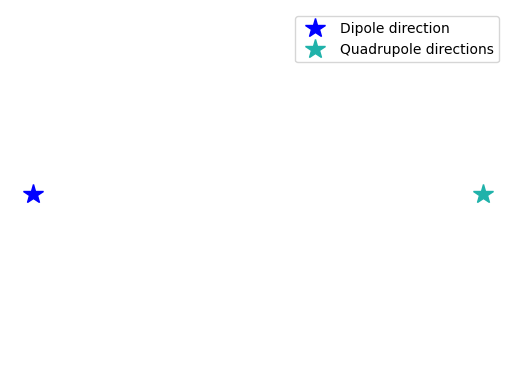

In [43]:
import matplotlib.pyplot as plt

fig, ax = plt.subplots()

# plot only markers (no line)
ax.plot(0, 0, marker="*", color="b", markersize=15, linestyle="None", label="Dipole direction")
ax.plot(1, 0, marker="*", color="lightseagreen", markersize=15, linestyle="None", label="Quadrupole directions")

ax.legend(loc="best")
ax.axis("off")

plt.savefig('../Thesis_images/legend.pdf')
plt.show()

# Need to download the rest of the iterations from the cluster when they are finished, and run the below figures for the averages, and recreate the above BF map

In [8]:
# pathname = '../log_dir/Dipole_and_Quadrupole_Data/Partial_Skies/Ecliptic_Poles/'
# models = ['Dipole_model', 'Dipole_Quadrupole_model']

# N_bar = 2000
# pixels = range(0, 108)
# iterations = range(0, 20)
# D_df = pd.DataFrame(columns=['model', 'pixel', 'D_array'])
# DQ_df = pd.DataFrame(columns=['model', 'pixel', 'D_array', 'Q_array'])

# for model in models:
#     for pix in pixels:

#         if model == 'Dipole_model':
#             samples = np.zeros((0, 4))  # assuming equal_weighted_post.txt has 4 columns: N_bar, D, l, b

#             for it in iterations:
#                 filepath = (
#                     f"{pathname}{model}/Nbar_{N_bar}/Nbar_{N_bar}_pixel_{pix}_iteration_{it}/chains/equal_weighted_post.txt"
#                 )

#                 if os.path.exists(filepath):
#                     try:
#                         sample_i = np.loadtxt(filepath, skiprows=1)  # skip header line
#                         # Ensure shape is correct
#                         if sample_i.ndim == 1:
#                             sample_i = sample_i[None, :]  # make it 2D if only one sample
#                         samples = np.vstack((samples, sample_i))
#                     except Exception as e:
#                         print(f"Error reading {filepath}: {e}")
#                 else:
#                     print(f'File not found: {filepath}')

#             if samples.shape[0] > 0:
#                 D_data = samples[:, 1]  # 2nd column is D
#                 D_df = pd.concat([D_df, pd.DataFrame([{
#                     'model': model,
#                     'pixel': pix,
#                     'D_array': D_data,
#                 }])], ignore_index=True)

#         elif model == 'Dipole_Quadrupole_model':
#             samples = np.zeros((0, 9))  # assuming equal_weighted_post.txt has 8 columns: N_bar, D, Q, l, b, l1, b1, l2, b2

#             for it in iterations:
#                 filepath = (
#                     f"{pathname}{model}/Nbar_{N_bar}/Nbar_{N_bar}_pixel_{pix}_iteration_{it}/chains/equal_weighted_post.txt"
#                 )

#                 if os.path.exists(filepath):
#                     try:
#                         sample_i = np.loadtxt(filepath, skiprows=1)  # skip header line
#                         # Ensure shape is correct
#                         if sample_i.ndim == 1:
#                             sample_i = sample_i[None, :]  # make it 2D if only one sample
#                         samples = np.vstack((samples, sample_i))
#                     except Exception as e:
#                         print(f"Error reading {filepath}: {e}")
#                 else:
#                     print(f'File not found: {filepath}')

#             if samples.shape[0] > 0:
#                 D_data = samples[:, 1]  # 2nd column is D
#                 Q_data = samples[:, 2]  # 3rd column is Q
#                 DQ_df = pd.concat([DQ_df, pd.DataFrame([{
#                     'model': model,
#                     'pixel': pix,
#                     'D_array': D_data,
#                     'Q_array': Q_data
#                 }])], ignore_index=True)

In [ ]:
# # Dipole model
# for index, row in D_df.iterrows():
#     plt.figure(figsize=(5, 4))
#     D_data = row['D_array']
#     plt.hist(D_data, bins=30, density=True, alpha=0.6, color='blue', edgecolor='blue', linewidth=3, histtype='stepfilled')
#     plt.hist(D_data, bins=30, density=True, color='blue', edgecolor='blue', linewidth=3, histtype='step')
#     plt.xlabel('Dipole Amplitude (D)')
#     plt.ylabel('Probability Density')

#     median_D = np.median(D_data)
#     plt.axvline(median_D, color='k', linestyle='--', linewidth=3, label='Median D')
#     plt.axvline(0.007, color='r', linestyle='--', linewidth=3, label='True D')
#     plt.yticks([])
#     plt.legend()
#     plt.xlim(0,0.03)
#     plt.tight_layout()
#     plt.savefig(f'../log_dir/Dipole_and_Quadrupole_Data/Partial_Skies/Ecliptic_Poles/Figures/Amplitude_Posteriors/Dipole_model/{row["model"]}_pixel_{row["pixel"]}_amplitude_posterior.png', dpi=300)
#     # plt.show()
#     plt.close()
#     # break

# # Dipole and Quadrupole Model
# for index, row in DQ_df.iterrows():
#     plt.figure(figsize=(5, 4))
#     D_data = row['D_array']
#     plt.hist(D_data, bins=30, density=True, alpha=0.6, color='blue', edgecolor='blue', linewidth=3, histtype='stepfilled')
#     plt.hist(D_data, bins=30, density=True, color='blue', edgecolor='blue', linewidth=3, histtype='step')
#     plt.xlabel('Dipole Amplitude (D)')
#     plt.ylabel('Probability Density')

#     median_D = np.median(D_data)
#     plt.axvline(median_D, color='k', linestyle='--', linewidth=3, label='Median D')
#     plt.axvline(0.007, color='r', linestyle='--', linewidth=3, label='True D')
#     plt.yticks([])
#     plt.legend()
#     plt.xlim(0,0.03)
#     plt.tight_layout()
#     plt.savefig(f'../log_dir/Dipole_and_Quadrupole_Data/Partial_Skies/Ecliptic_Poles/Figures/Amplitude_Posteriors/Dipole_Quadrupole_model/{row["model"]}_pixel_{row["pixel"]}_amplitude_posterior.png', dpi=300)
#     # plt.show()
#     plt.close()
#     # break

In [24]:
# read in the data
D_df = pd.read_csv('../log_dir/Dipole_and_Quadrupole_Data/Partial_Skies/Large_Slice/D_results.csv')
DQ_df = pd.read_csv('../log_dir/Dipole_and_Quadrupole_Data/Partial_Skies/Large_Slice/DQ_results.csv')

def str_to_array(s):
    if pd.isna(s) or s == '':
        return np.array([])  # return empty array if missing
    return np.fromstring(str(s), sep=' ')

D_df['D_array'] = D_df['D_array'].apply(str_to_array)
DQ_df['D_array'] = DQ_df['D_array'].apply(str_to_array)
DQ_df['Q_array'] = DQ_df['Q_array'].apply(str_to_array)


0.0 180.0 -180.0 180.0


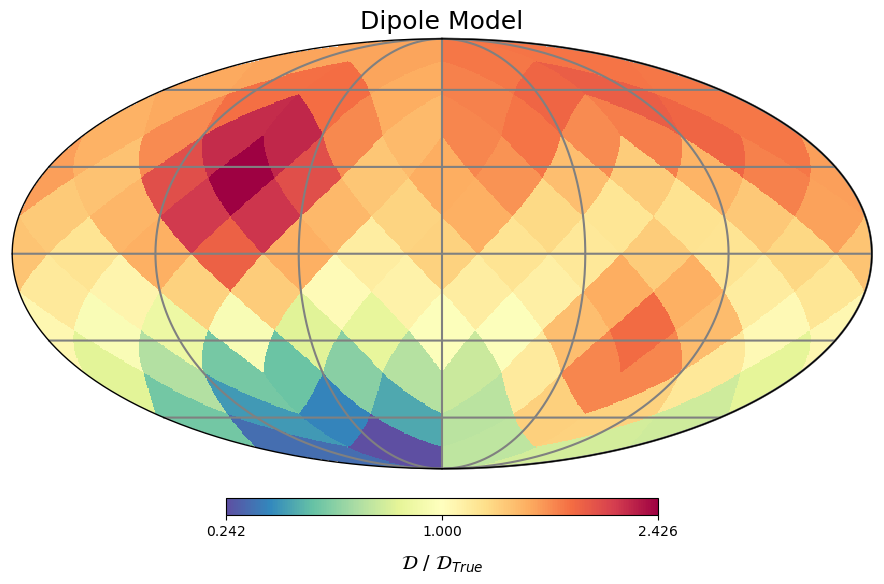

0.0 180.0 -180.0 180.0


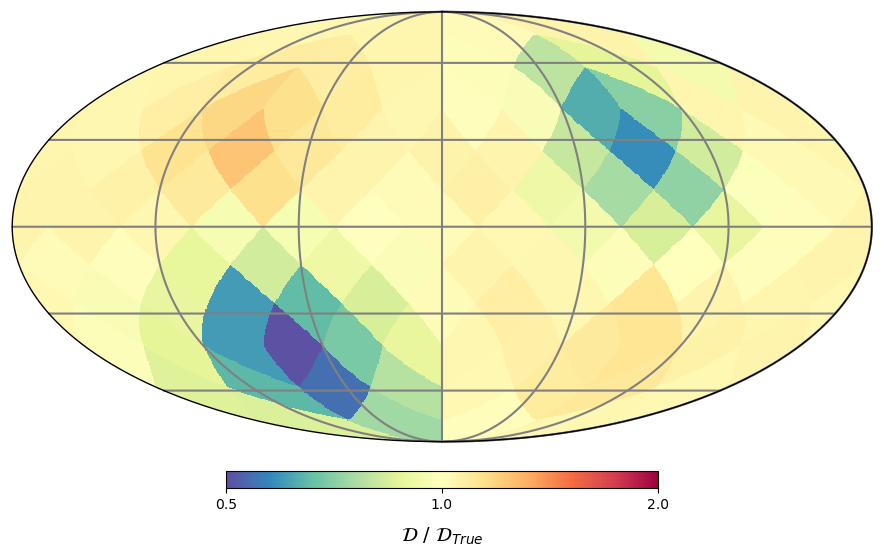

In [26]:
# Dipole Model
median_D_values = []
for index, row in D_df.iterrows():
    D_data = row['D_array']
    median_D = np.median(D_data)
    median_D_values.append(median_D)

median_D_values = np.array(median_D_values, dtype=float)
rescaled_medians = median_D_values / 0.007
median_D_values = rescaled_medians

# Normalization
vmin, vmax, midpoint = np.min(median_D_values), np.max(median_D_values), 0.007 / 0.007
norm = mcolors.TwoSlopeNorm(vmin=vmin, vcenter=midpoint, vmax=vmax)

# Plot with healpy
fig = plt.figure(figsize=(9,6))
hp.mollview(
    median_D_values,
    # title=r'Dipole Model',
    # unit=r'$\mathcal{D}$ / $\mathcal{D}_{True}$',
    cmap=plt.cm.Spectral_r,
    norm=norm,
    cbar=True,
    badcolor='white',
    fig=fig.number,
)

# Grab axes
ax = fig.axes[0]   # main Mollweide axis
cbar_ax = fig.axes[1]  # colorbar axis (bottom)

# Set title with bigger font
ax.set_title(r'Dipole Model', fontsize=18)

# Set colorbar label (as xlabel since it's horizontal)
cbar_ax.set_xlabel(r'$\mathcal{D}$ / $\mathcal{D}_{True}$', fontsize=14, labelpad=10)

hp.graticule(dpar=30, dmer=60, color='gray', lw=1.5, ls='-')
# Customize colorbar ticks
cbar_ax = plt.gcf().axes[-1]
cbar_ax.set_xticks([vmin, midpoint, vmax])
cbar_ax.set_xticklabels([f"{vmin:.3f}", f"{midpoint:.3f}", f"{vmax:.3f}"])


# plt.savefig('../log_dir/Dipole_and_Quadrupole_Data/Partial_Skies/Large_Slice/Figures/D_Median_Dipole_Amplitudes.pdf', dpi=300)

plt.show()

# Dipole and Quadrupole Model
median_D_values = []
for index, row in DQ_df.iterrows():
    D_data = row['D_array']
    median_D = np.median(D_data)
    median_D_values.append(median_D)

median_D_values = np.array(median_D_values, dtype=float)
rescaled_medians = median_D_values / 0.007
median_D_values = rescaled_medians

# Normalization
vmin, vmax, midpoint = np.min(median_D_values), np.max(median_D_values), 0.007 / 0.007
norm = mcolors.TwoSlopeNorm(vmin=vmin, vcenter=midpoint, vmax=vmax)

# Plot with healpy
fig = plt.figure(figsize=(9,6))
median_D_clipped = np.clip(median_D_values, 0.5, 2)
hp.mollview(
    median_D_clipped,
    # title=r'Dipole + Quadrupole Model: $\mathcal{D}$ / $\mathcal{D}_{True}$',
    cmap=plt.cm.Spectral_r,
    norm=norm,
    cbar=True,
    badcolor='white',
    fig=fig.number,
    min=0.5, max=2
)
# Grab axes
ax = fig.axes[0]   # main Mollweide axis
cbar_ax = fig.axes[1]  # colorbar axis (bottom)

# Set title with bigger font
ax.set_title(r'Dipole & Quadrupole Model', fontsize=18)
ax.set_title(None)

# Set colorbar label (as xlabel since it's horizontal)
cbar_ax.set_xlabel(r'$\mathcal{D}$ / $\mathcal{D}_{True}$', fontsize=14, labelpad=10)
hp.graticule(dpar=30, dmer=60, color='gray', lw=1.5, ls='-')
# Customize colorbar ticks
cbar_ax = plt.gcf().axes[-1]
# cbar_ax.set_xticks([vmin, midpoint, vmax])
# cbar_ax.set_xticklabels([f"{vmin:.3f}", f"{midpoint:.3f}", f"{vmax:.3f}"])
cbar_ax.set_xticks([0.5, 1, 2])
cbar_ax.set_xticklabels(['0.5', '1.0', '2.0'])
plt.savefig('../log_dir/Dipole_and_Quadrupole_Data/Partial_Skies/Ecliptic_Poles/Figures/DQ_Median_Dipole_Amplitudes_clipped_large_slice.pdf', dpi=300)
plt.show()



0.0 180.0 -180.0 180.0


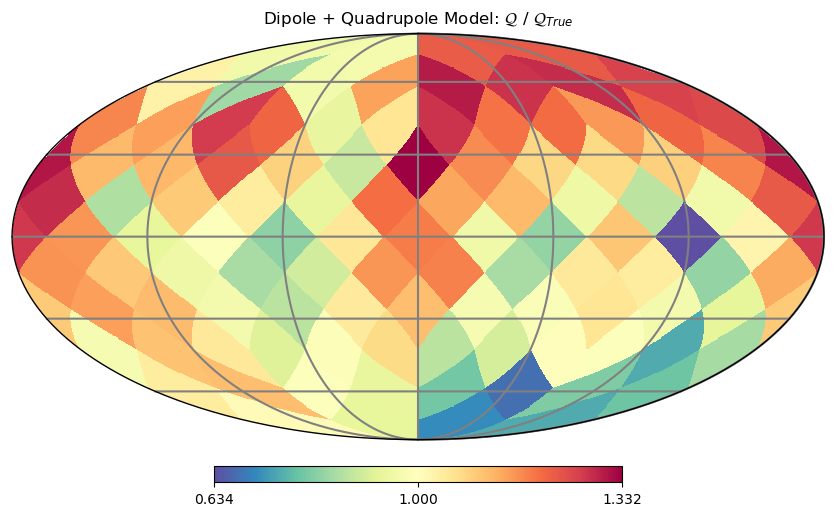

In [21]:
# Dipole and Quadrupole Model
median_Q_values = []
for index, row in DQ_df.iterrows():
    Q_data = row['Q_array']
    median_Q = np.median(Q_data)
    median_Q_values.append(median_Q)

median_Q_values = np.array(median_Q_values, dtype=float)
rescaled_medians = median_Q_values / 0.014
median_Q_values = rescaled_medians

# Normalization
vmin, vmax, midpoint = np.min(median_Q_values), np.max(median_Q_values), 0.014 /0.014
norm = mcolors.TwoSlopeNorm(vmin=vmin, vcenter=midpoint, vmax=vmax)

# Plot with healpy
hp.mollview(
    median_Q_values,
    title=r'Dipole + Quadrupole Model: $\mathcal{Q}$ / $\mathcal{Q}_{True}$',
    cmap=plt.cm.Spectral_r,
    norm=norm,
    cbar=True,
    badcolor='white' 
)
hp.graticule(dpar=30, dmer=60, color='gray', lw=1.5, ls='-')
# Customize colorbar ticks
cbar_ax = plt.gcf().axes[-1]
cbar_ax.set_xticks([vmin, midpoint, vmax])
cbar_ax.set_xticklabels([f"{vmin:.3f}", f"{midpoint:.3f}", f"{vmax:.3f}"])

# plt.savefig('../log_dir/Dipole_and_Quadrupole_Data/Partial_Skies/Ecliptic_Poles/Figures/DQ_Median_Quadrupole_Amplitudes.png', dpi=300)

plt.show()

In [19]:
NSIDE = 1
print(
    "Approximate resolution at NSIDE {} is {:.2} deg".format(
        NSIDE, hp.nside2resol(NSIDE, arcmin=True) / 60
    )
)

Approximate resolution at NSIDE 1 is 5.9e+01 deg


In [30]:
NSIDE=64
pixel_area = (hp.nside2resol(NSIDE, arcmin=True) / 60)**2
pixel_area*hp.nside2npix(NSIDE)

41252.96124941928

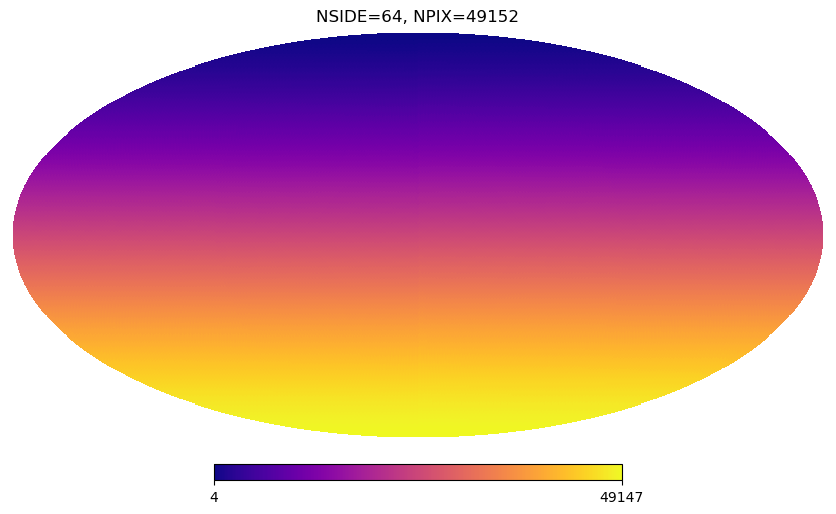

In [40]:
nside=64
npix=hp.nside2npix(nside)
hp.mollview(np.arange(npix), title=f"NSIDE={nside}, NPIX={npix}", cmap="plasma")

### Ewan tester

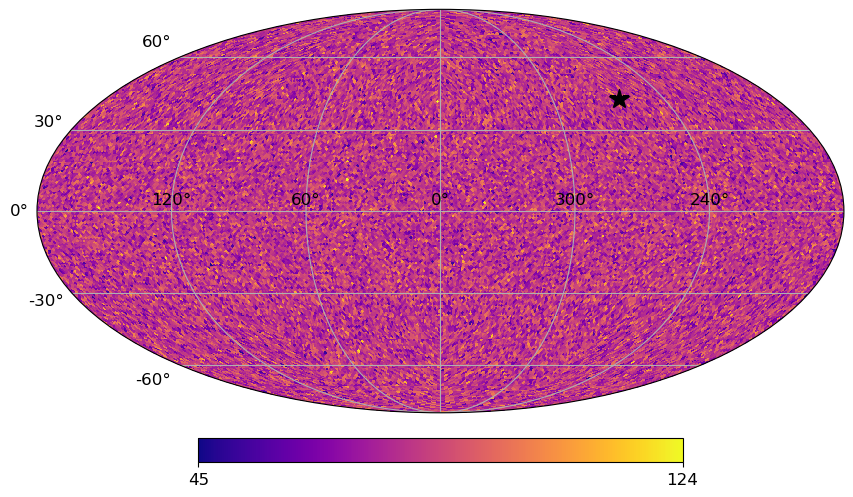

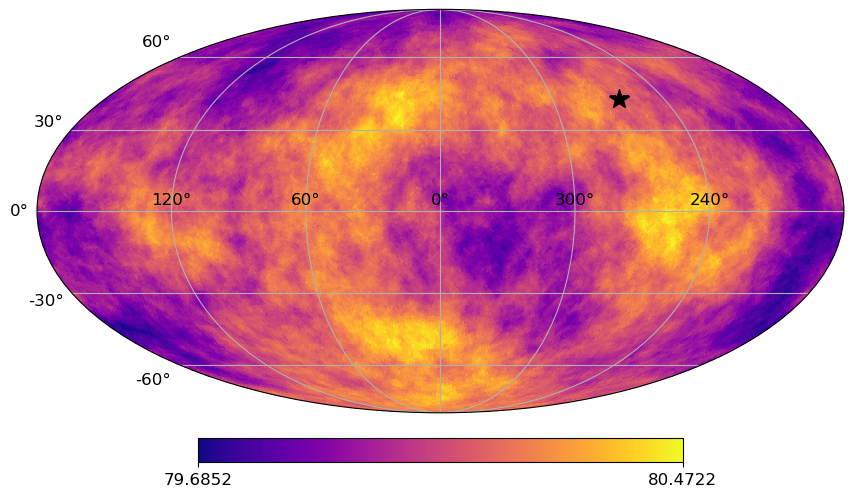

In [43]:
NSIDE=64
NPIX = hp.nside2npix(NSIDE)
dipole_theta = np.deg2rad(48) # CMB Directions
dipole_phi = -np.deg2rad(360-264)
D_true = 0.0025
N_bar_true = 80
m, lambda_i = dipole_sampling(64, N_bar=N_bar_true, D=D_true, dipole_theta=dipole_theta, dipole_phi=dipole_phi)
dipole_plotting(m, dipole_theta, dipole_phi, cmap='plasma')

smooth_map = compute_smooth_map(m, angle_scale=1)
dipole_plotting(smooth_map, dipole_theta, dipole_phi, cmap='plasma')



In [40]:
def vectorised_dipole_prior(cube):
    params = cube.copy()
    params[:,0] = cube[:,0]*100 # 0 - 100
    params[:,1] = cube[:,1]/10 # 0 - 0.1
    params[:,2] = cube[:,2]*2*np.pi # 0 - 2pi
    
    c = cube[:,3] # 0 - 1, used to calculate theta below. 
    params[:,3] = np.arccos(np.clip(1 - 2*c, -1, 1)) #Clipping to ensure we stay in the valid range
    
    return params

def vectorised_dipole_likelihood(params):
    N_bar = params[:,0]
    D = params[:,1]
    l, b = params[:,2], params[:,3]

    dipole_vec = hp.ang2vec(b, l)  # shape (n_samples, 3)
    pixels = np.vstack(hp.pix2vec(NSIDE, np.arange(NPIX)))  # Shape (3, NPIX)

    dot_product = np.dot(dipole_vec, pixels)  # shape (n_sample, NPIX)
    angles = np.arccos(dot_product) # shape (n_sample, NPIX)
    dipole_signal = D * np.cos(angles).T # shape (NPIX, n_samples), to match D shape

    lambda_i = N_bar * (1 + dipole_signal)  # shape (NPIX, n_samples)    
    log_likelihoods = np.sum(poisson.logpmf(m, mu=lambda_i.T), axis=1)  # shape (n_samples,)
    return log_likelihoods

In [45]:
dipole_param_names = ['N_bar', 'D', 'l', 'b']

dipole_sampler = ultranest.ReactiveNestedSampler(dipole_param_names, vectorised_dipole_likelihood, vectorised_dipole_prior, vectorized=True)
dipole_result = dipole_sampler.run()

[ultranest] Sampling 400 live points from prior ...


[ultranest] Explored until L=-2e+05  ..-177581.16 [-177581.2892..-177581.2892]*| it/evals=6541/15999 eff=41.9322% N=400 
[ultranest] Likelihood function evaluations: 15999
[ultranest]   logZ = -1.776e+05 +- 0.1314
[ultranest] Effective samples strategy satisfied (ESS = 1662.1, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.46+-0.09 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.13, need <0.5)
[ultranest]   logZ error budget: single: 0.16 bs:0.13 tail:0.01 total:0.13 required:<0.50
[ultranest] done iterating.


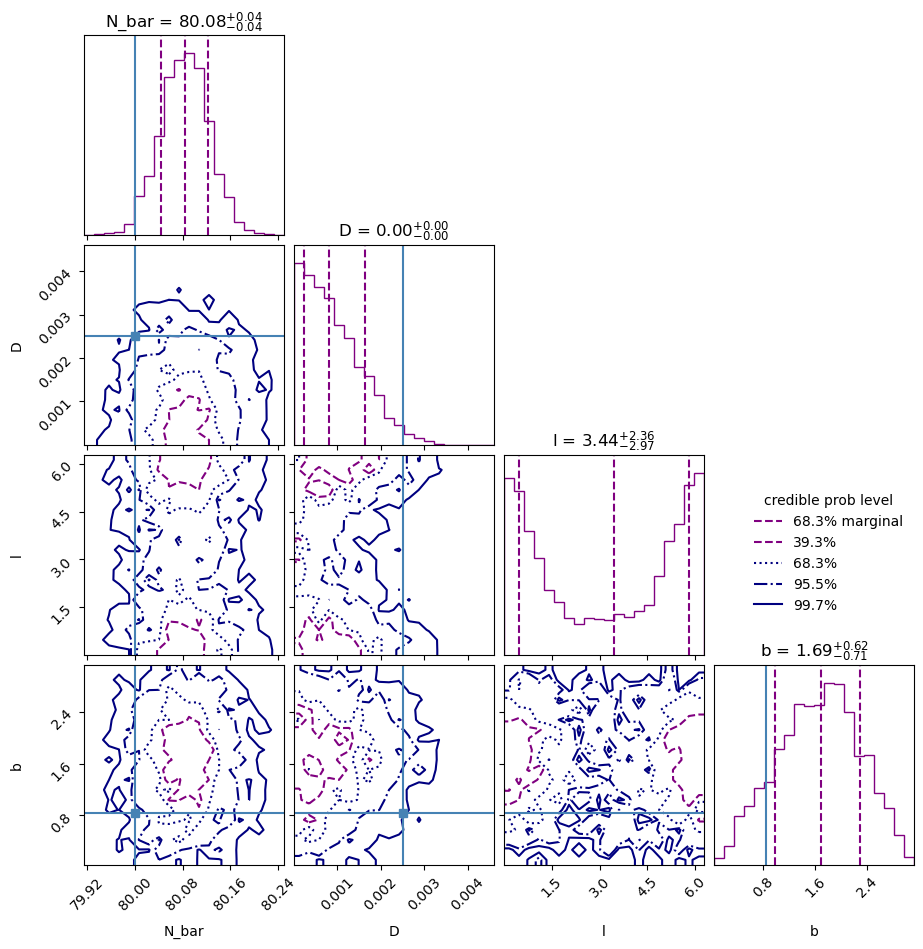

In [ ]:
cornerplot(dipole_result, truths=[N_bar_true, D_true, dipole_phi, dipole_theta])
plt.show()